![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/1hr_workshop/SparkNLP_openSource_intro_v_2_7_5_viz.ipynb)

# Spark NLP Open Source Workshop - 1 hr

This is the 1 hr workshop version of the entire training notebooks : https://github.com/JohnSnowLabs/spark-nlp-workshop/tree/master/tutorials/Certification_Trainings/Public

an intro article for Spark NLP:

https://towardsdatascience.com/introduction-to-spark-nlp-foundations-and-basic-components-part-i-c83b7629ed59

How to start Spark NLP in 2 weeks:

https://towardsdatascience.com/how-to-get-started-with-sparknlp-in-2-weeks-cb47b2ba994d

https://towardsdatascience.com/how-to-wrap-your-head-around-spark-nlp-a6f6a968b7e8

Article for NER and text classification in Spark NLP

https://towardsdatascience.com/named-entity-recognition-ner-with-bert-in-spark-nlp-874df20d1d77

https://medium.com/spark-nlp/named-entity-recognition-for-healthcare-with-sparknlp-nerdl-and-nercrf-a7751b6ad571

https://towardsdatascience.com/text-classification-in-spark-nlp-with-bert-and-universal-sentence-encoders-e644d618ca32

a webinar to show how to train a NER model from scratch (90 min)

https://www.youtube.com/watch?v=djWX0MR2Ooo

workshop repo that you can start playing with Spark NLP in Colab
(you will also see Databricks notebook under each folder)

https://github.com/JohnSnowLabs/spark-nlp-workshop/tree/master/tutorials/Certification_Trainings


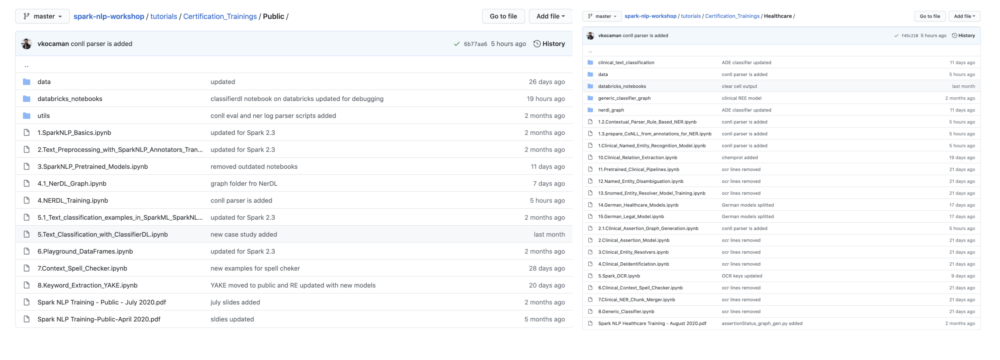

## Coding ...

In [ ]:
import os

# Install java
! apt-get update -qq
! apt-get install -y openjdk-8-jdk-headless -qq > /dev/null

os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["PATH"] = os.environ["JAVA_HOME"] + "/bin:" + os.environ["PATH"]
! java -version

# Install pyspark
! pip install --ignore-installed -q pyspark==2.4.4

# Install sparknlp
! pip install --ignore-installed -q spark-nlp==2.7.5

# Install sparknlp-display
! pip install spark-nlp-display

In [2]:
import sparknlp

In [3]:
import sparknlp
from pyspark.ml import Pipeline
from sparknlp.base import *
import pyspark.sql.functions as F
from sparknlp.annotator import *

spark = sparknlp.start()

# params =>> gpu=False, spark23=False (start with spark 2.3)

print("Spark NLP version", sparknlp.version())
print("Apache Spark version:", spark.version)

Spark NLP version 2.7.5
Apache Spark version: 2.4.4


## Using Pretrained Pipelines

for a more detailed notebook, see https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/1.SparkNLP_Basics.ipynb

In [ ]:
from sparknlp.pretrained import PretrainedPipeline

pipeline_dl = PretrainedPipeline('explain_document_dl', lang='en')


explain_document_dl download started this may take some time.
Approx size to download 168.4 MB
[OK!]


**Stages**
- DocumentAssembler
- SentenceDetector
- Tokenizer
- NER (NER with GloVe 100D embeddings, CoNLL2003 dataset)
- Lemmatizer
- Stemmer
- Part of Speech
- SpellChecker (Norvig)


In [ ]:
testDoc = '''
Peter Parker is a very good persn.
My life in Russia is very intersting.
John and Peter are brothrs. However they don't support each other that much.
Mercedes Benz is also working on a driverless car.
Europe is very culture rich. There are huge churches! and big houses!
'''

result = pipeline_dl.annotate(testDoc)


In [ ]:
result.keys()

dict_keys(['entities', 'stem', 'checked', 'lemma', 'document', 'pos', 'token', 'ner', 'embeddings', 'sentence'])

In [ ]:
result['entities']

['Peter Parker', 'Russia', 'John', 'Peter', 'Mercedes Benz', 'Europe']

In [ ]:
import pandas as pd

df = pd.DataFrame({'token':result['token'], 'ner_label':result['ner'],
                      'spell_corrected':result['checked'], 'POS':result['pos'],
                      'lemmas':result['lemma'], 'stems':result['stem']})

df

,token,ner_label,spell_corrected,POS,lemmas,stems
0,Peter,B-PER,Peter,NNP,Peter,peter
1,Parker,I-PER,Parker,NNP,Parker,parker
2,is,O,is,VBZ,be,i
3,a,O,a,DT,a,a
4,very,O,very,RB,very,veri
5,good,O,good,JJ,good,good
6,persn,O,person,NN,person,person
7,.,O,.,.,.,.
8,My,O,My,PRP$,My,my
9,life,O,life,NN,life,life


### Using fullAnnotate to get more details



In [ ]:
detailed_result = pipeline_dl.fullAnnotate(testDoc)

detailed_result[0]['entities']

[Annotation(chunk, 1, 12, Peter Parker, {'entity': 'PER', 'sentence': '0', 'chunk': '0'}),
 Annotation(chunk, 47, 52, Russia, {'entity': 'LOC', 'sentence': '1', 'chunk': '1'}),
 Annotation(chunk, 74, 77, John, {'entity': 'PER', 'sentence': '2', 'chunk': '2'}),
 Annotation(chunk, 83, 87, Peter, {'entity': 'PER', 'sentence': '2', 'chunk': '3'}),
 Annotation(chunk, 151, 163, Mercedes Benz, {'entity': 'ORG', 'sentence': '4', 'chunk': '4'}),
 Annotation(chunk, 202, 207, Europe, {'entity': 'LOC', 'sentence': '5', 'chunk': '5'})]

In [ ]:
chunks=[]
entities=[]
for n in detailed_result[0]['entities']:
        
  chunks.append(n.result)
  entities.append(n.metadata['entity']) 
    
df = pd.DataFrame({'chunks':chunks, 'entities':entities})
df    

,chunks,entities
0,Peter Parker,PER
1,Russia,LOC
2,John,PER
3,Peter,PER
4,Mercedes Benz,ORG
5,Europe,LOC


In [ ]:
tuples = []

for x,y,z in zip(detailed_result[0]["token"], detailed_result[0]["pos"], detailed_result[0]["ner"]):

  tuples.append((int(x.metadata['sentence']), x.result, x.begin, x.end, y.result, z.result))

df = pd.DataFrame(tuples, columns=['sent_id','token','start','end','pos', 'ner'])

df


,sent_id,token,start,end,pos,ner
0,0,Peter,1,5,NNP,B-PER
1,0,Parker,7,12,NNP,I-PER
2,0,is,14,15,VBZ,O
3,0,a,17,17,DT,O
4,0,very,19,22,RB,O
5,0,good,24,27,JJ,O
6,0,persn,29,33,NN,O
7,0,.,34,34,.,O
8,1,My,36,37,PRP$,O
9,1,life,39,42,NN,O


### Use pretrained match_chunk pipeline to extract phrases

**Stages**
- DocumentAssembler
- SentenceDetector
- Tokenizer
- Part of Speech
- Chunker

Pipeline:

- The pipeline uses regex `<DT>?<JJ>*<NN>+`
- which states that whenever the chunk finds an optional determiner (DT) followed by any number of adjectives (JJ) and then a noun (NN) then the Noun Phrase(NP) chunk should be formed.

In [ ]:
pipeline = PretrainedPipeline('match_chunks', lang='en')


match_chunks download started this may take some time.
Approx size to download 4.3 MB
[OK!]


In [ ]:
result = pipeline.annotate("the little yellow dog barked at the cat") #multiple noune phrases

result

{'chunk': ['the little yellow dog', 'the cat'],
 'document': ['the little yellow dog barked at the cat'],
 'pos': ['DT', 'JJ', 'JJ', 'NN', 'JJ', 'IN', 'DT', 'NN'],
 'sentence': ['the little yellow dog barked at the cat'],
 'token': ['the', 'little', 'yellow', 'dog', 'barked', 'at', 'the', 'cat']}

### Extract exact dates from referential date phrases

In [ ]:
pipeline = PretrainedPipeline('match_datetime', lang='en')

detailed_result = pipeline.fullAnnotate("I saw him yesterday and he told me that he will visit us next week")

detailed_result[0]['date']

match_datetime download started this may take some time.
Approx size to download 12.9 KB
[OK!]


[Annotation(date, 57, 65, 2021/03/24, {'sentence': '0'}),
 Annotation(date, 10, 18, 2021/03/16, {'sentence': '0'})]

### Sentiment Analysis


In [ ]:
sentiment = PretrainedPipeline('analyze_sentiment', lang='en')

analyze_sentiment download started this may take some time.
Approx size to download 4.9 MB
[OK!]


In [ ]:
result = sentiment.annotate("The movie I watched today was not a good one")

result['sentiment']

['negative']

In [ ]:
# DL version (using Universal sentence encoder - USE)
# 930 MB as it downloads the USE as well
sentiment_twitter = PretrainedPipeline('analyze_sentimentdl_use_twitter', lang='en')

analyze_sentimentdl_use_twitter download started this may take some time.
Approx size to download 935.1 MB
[OK!]


## Using the modules in a pipeline for custom tasks

for a more detailed notebook, see https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/2.Text_Preprocessing_with_SparkNLP_Annotators_Transformers.ipynb

In [ ]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp-workshop/master/jupyter/annotation/english/spark-nlp-basics/sample-sentences-en.txt

In [ ]:
with open('./sample-sentences-en.txt') as f:
  print (f.read())

Peter is a very good person.
My life in Russia is very interesting.
John and Peter are brothers. However they don't support each other that much.
Lucas Nogal Dunbercker is no longer happy. He has a good car though.
Europe is very culture rich. There are huge churches! and big houses!


In [ ]:
spark_df = spark.read.text('./sample-sentences-en.txt').toDF('text')

spark_df.show(truncate=False)

+-----------------------------------------------------------------------------+
|text                                                                         |
+-----------------------------------------------------------------------------+
|Peter is a very good person.                                                 |
|My life in Russia is very interesting.                                       |
|John and Peter are brothers. However they don't support each other that much.|
|Lucas Nogal Dunbercker is no longer happy. He has a good car though.         |
|Europe is very culture rich. There are huge churches! and big houses!        |
+-----------------------------------------------------------------------------+



In [ ]:
textFiles = spark.sparkContext.wholeTextFiles("./*.txt",4)
    
spark_df_folder = textFiles.toDF(schema=['path','text'])

spark_df_folder.show(truncate=30)

+------------------------------+------------------------------+
|                          path|                          text|
+------------------------------+------------------------------+
|file:/content/sample-senten...|Peter is a very good person...|
+------------------------------+------------------------------+



In [ ]:
documentAssembler = DocumentAssembler()\
    .setInputCol("text")\
    .setOutputCol("document")

sentenceDetector = SentenceDetector()\
    .setInputCols(['document'])\
    .setOutputCol('sentences')

tokenizer = Tokenizer() \
    .setInputCols(["sentences"]) \
    .setOutputCol("token")

nlpPipeline = Pipeline(stages=[
    documentAssembler, 
    sentenceDetector,
    tokenizer
 ])

empty_df = spark.createDataFrame([['']]).toDF("text")

pipelineModel = nlpPipeline.fit(empty_df)

In [ ]:
result = pipelineModel.transform(spark_df)


In [ ]:
result.show(truncate=20)


+--------------------+--------------------+--------------------+--------------------+
|                text|            document|           sentences|               token|
+--------------------+--------------------+--------------------+--------------------+
|Peter is a very g...|[[document, 0, 27...|[[document, 0, 27...|[[token, 0, 4, Pe...|
|My life in Russia...|[[document, 0, 37...|[[document, 0, 37...|[[token, 0, 1, My...|
|John and Peter ar...|[[document, 0, 76...|[[document, 0, 27...|[[token, 0, 3, Jo...|
|Lucas Nogal Dunbe...|[[document, 0, 67...|[[document, 0, 41...|[[token, 0, 4, Lu...|
|Europe is very cu...|[[document, 0, 68...|[[document, 0, 27...|[[token, 0, 5, Eu...|
+--------------------+--------------------+--------------------+--------------------+



In [ ]:
result.printSchema()


root
 |-- text: string (nullable = true)
 |-- document: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = true)
 |    |    |-- embeddings: array (nullable = true)
 |    |    |    |-- element: float (containsNull = false)
 |-- sentences: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- annotatorType: string (nullable = true)
 |    |    |-- begin: integer (nullable = false)
 |    |    |-- end: integer (nullable = false)
 |    |    |-- result: string (nullable = true)
 |    |    |-- metadata: map (nullable = true)
 |    |    |    |-- key: string
 |    |    |    |-- value: string (valueContainsNull = tru

In [ ]:
result.select('sentences.result').take(3)


[Row(result=['Peter is a very good person.']),
 Row(result=['My life in Russia is very interesting.']),
 Row(result=['John and Peter are brothers.', "However they don't support each other that much."])]

### StopWords Cleaner

In [ ]:
stopwords_cleaner = StopWordsCleaner()\
      .setInputCols("token")\
      .setOutputCol("cleanTokens")\
      .setCaseSensitive(False)\

In [ ]:
stopwords_cleaner.getStopWords()[:10]

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'your']

In [ ]:
documentAssembler = DocumentAssembler()\
      .setInputCol("text")\
      .setOutputCol("document")

tokenizer = Tokenizer() \
      .setInputCols(["document"]) \
      .setOutputCol("token")

nlpPipeline = Pipeline(stages=[
      documentAssembler, 
      tokenizer,
      stopwords_cleaner
 ])

empty_df = spark.createDataFrame([['']]).toDF("text")

pipelineModel = nlpPipeline.fit(empty_df)

result = pipelineModel.transform(spark_df)

result.show()

+--------------------+--------------------+--------------------+--------------------+
|                text|            document|               token|         cleanTokens|
+--------------------+--------------------+--------------------+--------------------+
|Peter is a very g...|[[document, 0, 27...|[[token, 0, 4, Pe...|[[token, 0, 4, Pe...|
|My life in Russia...|[[document, 0, 37...|[[token, 0, 1, My...|[[token, 3, 6, li...|
|John and Peter ar...|[[document, 0, 76...|[[token, 0, 3, Jo...|[[token, 0, 3, Jo...|
|Lucas Nogal Dunbe...|[[document, 0, 67...|[[token, 0, 4, Lu...|[[token, 0, 4, Lu...|
|Europe is very cu...|[[document, 0, 68...|[[token, 0, 5, Eu...|[[token, 0, 5, Eu...|
+--------------------+--------------------+--------------------+--------------------+



In [ ]:
result.select('cleanTokens.result').take(1)


[Row(result=['Peter', 'good', 'person', '.'])]

### Text Matcher

In [ ]:
! wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp-workshop/master/tutorials/Certification_Trainings/Public/data/news_category_train.csv

news_df = spark.read \
      .option("header", True) \
      .csv("news_category_train.csv")


In [ ]:
news_df.show(5, truncate=50)

+--------+--------------------------------------------------+
|category|                                       description|
+--------+--------------------------------------------------+
|Business| Short sellers, Wall Street's dwindling band of...|
|Business| Private investment firm Carlyle Group, which h...|
|Business| Soaring crude prices plus worries about the ec...|
|Business| Authorities have halted oil export flows from ...|
|Business| Tearaway world oil prices, toppling records an...|
+--------+--------------------------------------------------+
only showing top 5 rows



In [ ]:
entities = ['Wall Street', 'USD', 'stock', 'NYSE']
with open ('financial_entities.txt', 'w') as f:
    for i in entities:
        f.write(i+'\n')


entities = ['soccer', 'world cup', 'Messi', 'FC Barcelona']
with open ('sport_entities.txt', 'w') as f:
    for i in entities:
        f.write(i+'\n')


In [ ]:
documentAssembler = DocumentAssembler()\
    .setInputCol("description")\
    .setOutputCol("document")

tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("token")

financial_entity_extractor = TextMatcher() \
    .setInputCols(["document",'token'])\
    .setOutputCol("financial_entities")\
    .setEntities("financial_entities.txt")\
    .setCaseSensitive(False)\
    .setEntityValue('financial_entity')

sport_entity_extractor = TextMatcher() \
    .setInputCols(["document",'token'])\
    .setOutputCol("sport_entities")\
    .setEntities("sport_entities.txt")\
    .setCaseSensitive(False)\
    .setEntityValue('sport_entity')


nlpPipeline = Pipeline(stages=[
    documentAssembler, 
    tokenizer,
    financial_entity_extractor,
    sport_entity_extractor
 ])

empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

In [ ]:
result = pipelineModel.transform(news_df)


In [ ]:
result.select('financial_entities.result','sport_entities.result').take(2)

# result will be empty because there is no financial or sport entity first 2 lines. Try .take(3)

[Row(result=[], result=[]), Row(result=[], result=[])]

In [ ]:

result.select('description','financial_entities.result','sport_entities.result')\
.toDF('text','financial_matches','sport_matches').filter((F.size('financial_matches')>1) | (F.size('sport_matches')>1))\
.show(truncate=70)


+----------------------------------------------------------------------+----------------------------------+-------------------+
|                                                                  text|                 financial_matches|      sport_matches|
+----------------------------------------------------------------------+----------------------------------+-------------------+
|"Company launched the biggest electronic auction of stock in Wall S...|              [stock, Wall Street]|                 []|
|Google, Inc. significantly cut the expected share price for its ini...|                    [stock, stock]|                 []|
|Google, Inc. significantly cut the expected share price this mornin...|                    [stock, stock]|                 []|
| Shares of Air Canada  (AC.TO) fell by more than half on Wednesday,...|                    [Stock, stock]|                 []|
|Stock prices are lower in moderate trading. The Dow Jones Industria...|                    [Stock, Stoc

### Using the pipeline in a LightPipeline

In [ ]:
light_model = LightPipeline(pipelineModel)

light_result = light_model.fullAnnotate("Google, Inc. significantly cut the expected share price for its stock at Wall Street")

light_result[0]['financial_entities']

[Annotation(chunk, 64, 68, stock, {'entity': 'financial_entity', 'sentence': '0', 'chunk': '0'}),
 Annotation(chunk, 73, 83, Wall Street, {'entity': 'financial_entity', 'sentence': '0', 'chunk': '1'})]

## Pretrained Models

Spark NLP offers the following pre-trained models in around **40 languages** and all you need to do is to load the pre-trained model into your disk by specifying the model name and then configuring the model parameters as per your use case and dataset. Then you will not need to worry about training a new model from scratch and will be able to enjoy the pre-trained SOTA algorithms directly applied to your own data with transform().

In the official documentation, you can find detailed information regarding how these models are trained by using which algorithms and datasets.

https://github.com/JohnSnowLabs/spark-nlp-models

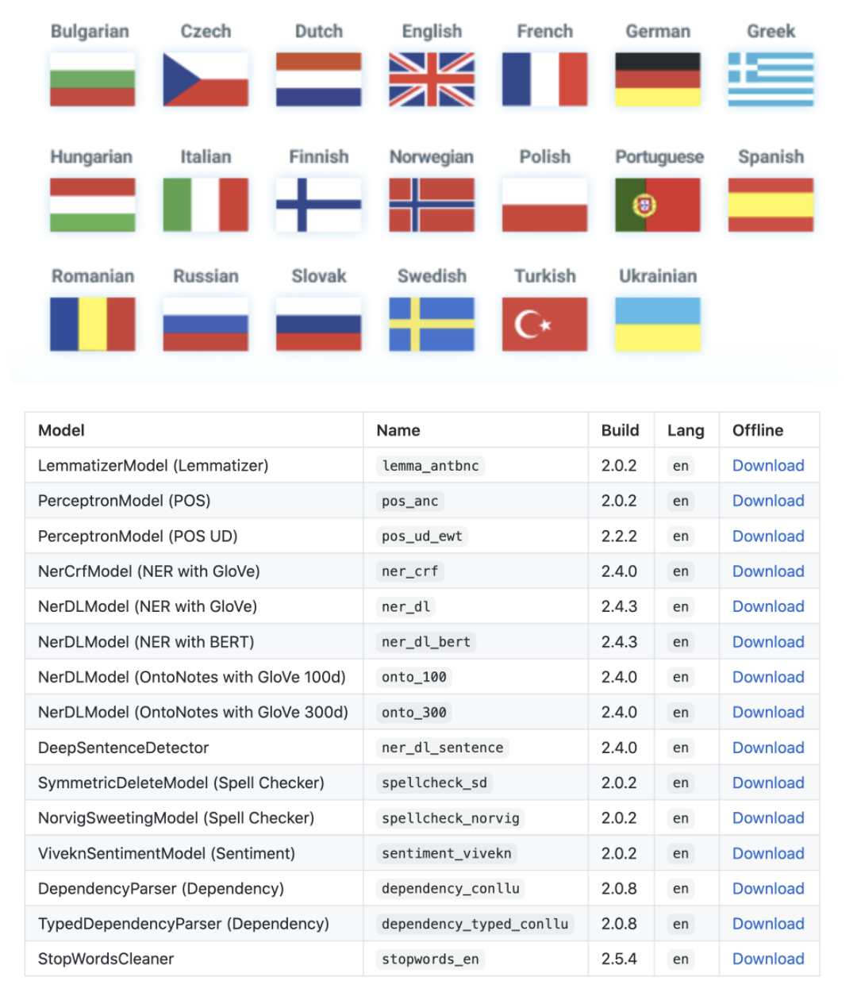

for a more detailed notebook, see https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/3.SparkNLP_Pretrained_Models.ipynb

### LemmatizerModel and ContextSpellCheckerModel

In [ ]:
documentAssembler = DocumentAssembler()\
    .setInputCol("text")\
    .setOutputCol("document")

tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("token")

spellModel = ContextSpellCheckerModel\
    .pretrained('spellcheck_dl')\
    .setInputCols("token")\
    .setOutputCol("checked")

lemmatizer = LemmatizerModel.pretrained('lemma_antbnc', 'en') \
    .setInputCols(["checked"]) \
    .setOutputCol("lemma")

pipeline = Pipeline(
    stages = [
    documentAssembler,
    tokenizer,
    spellModel,
    lemmatizer
  ])

empty_ds = spark.createDataFrame([[""]]).toDF("text")

sc_model = pipeline.fit(empty_ds)

lp = LightPipeline(sc_model)

spellcheck_dl download started this may take some time.
Approximate size to download 112.2 MB
[OK!]
lemma_antbnc download started this may take some time.
Approximate size to download 907.6 KB
[OK!]


In [ ]:
result = lp.annotate("Plaese alliow me tao introdduce myhelf, I am a man of waelth und tiaste and he just knows that")

list(zip(result['token'],result['checked'],result['lemma']))

[('Plaese', 'Please', 'Please'),
 ('alliow', 'allow', 'allow'),
 ('me', 'me', 'i'),
 ('tao', 'to', 'to'),
 ('introdduce', 'introduce', 'introduce'),
 ('myhelf', 'myself', 'myself'),
 (',', ',', ','),
 ('I', 'I', 'I'),
 ('am', 'am', 'be'),
 ('a', 'a', 'a'),
 ('man', 'man', 'man'),
 ('of', 'of', 'of'),
 ('waelth', 'wealth', 'wealth'),
 ('und', 'und', 'und'),
 ('tiaste', 'taste', 'taste'),
 ('and', 'and', 'and'),
 ('he', 'he', 'he'),
 ('just', 'just', 'just'),
 ('knows', 'knows', 'know'),
 ('that', 'that', 'that')]

### Word and Sentence Embeddings

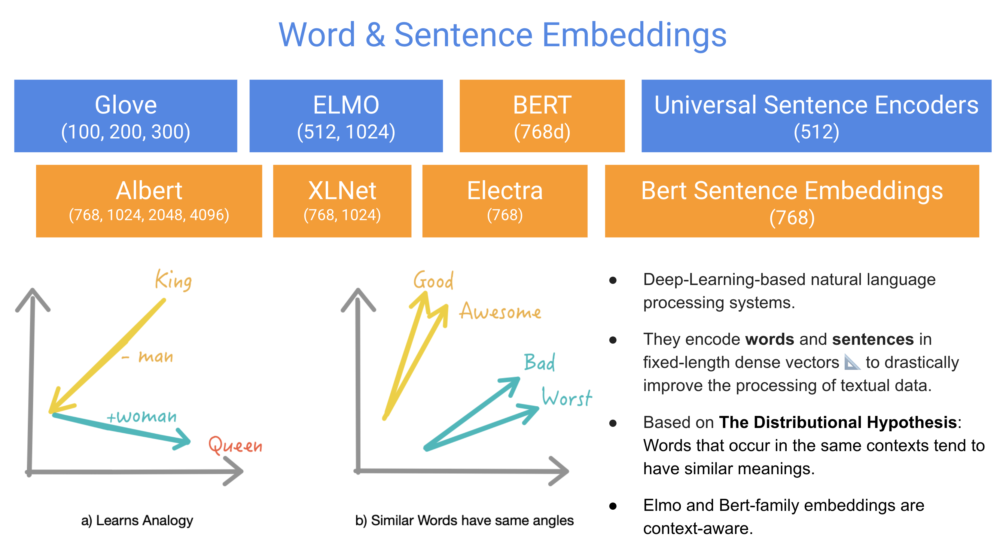

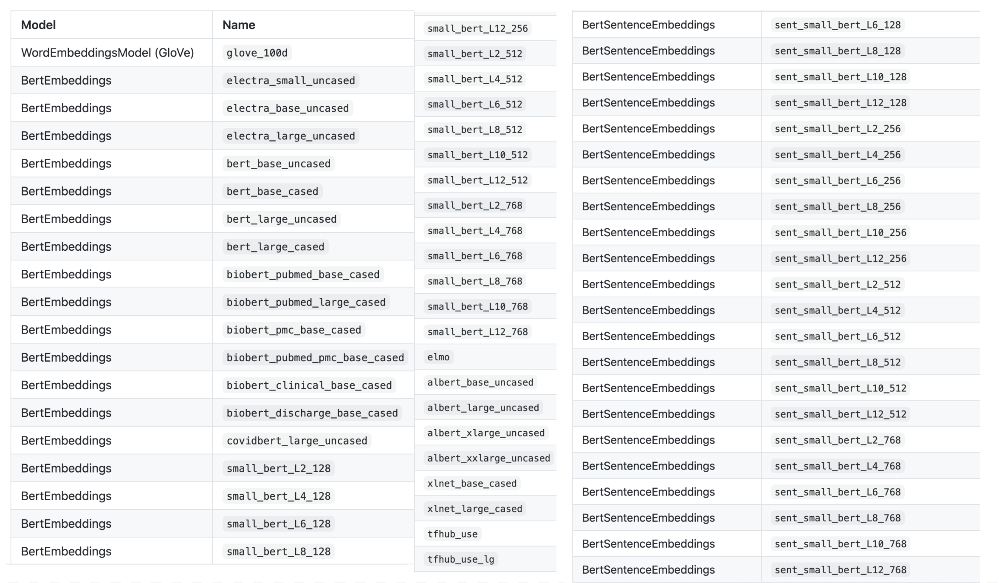

#### Word Embeddings

In [ ]:
glove_embeddings = WordEmbeddingsModel.pretrained('glove_100d')\
          .setInputCols(["document", "token"])\
          .setOutputCol("embeddings")

glove_100d download started this may take some time.
Approximate size to download 145.3 MB
[OK!]


In [ ]:
documentAssembler = DocumentAssembler()\
    .setInputCol("description")\
    .setOutputCol("document")

tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("token")

nlpPipeline = Pipeline(stages=[
    documentAssembler, 
    tokenizer,
    glove_embeddings
 ])

empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

result = pipelineModel.transform(news_df.limit(1))

output = result.select('token.result','embeddings.embeddings').limit(1).rdd.flatMap(lambda x: x).collect()


In [ ]:
pd.DataFrame({'token':output[0],'embeddings':output[1]})

,token,embeddings
0,Short,"[-0.4308899939060211, -0.023907000198960304, -..."
1,sellers,"[0.1458200067281723, 0.2753300070762634, -0.20..."
2,",","[-0.10767000168561935, 0.11052999645471573, 0...."
3,Wall,"[0.21383999288082123, 0.22098000347614288, 0.0..."
4,Street's,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
5,dwindling,"[-0.5611299872398376, 1.1217999458312988, 0.65..."
6,band,"[-0.12160000205039978, -0.24347999691963196, 0..."
7,of,"[-0.15289999544620514, -0.24278999865055084, 0..."
8,ultra,"[-0.3504500091075897, -0.27733999490737915, 0...."
9,cynics,"[-0.06557200103998184, 0.45271000266075134, 0...."


In [ ]:
result = pipelineModel.transform(news_df.limit(10))

result_df = result.select(F.explode(F.arrays_zip('token.result', 'embeddings.embeddings')).alias("cols")) \
.select(F.expr("cols['0']").alias("token"),
        F.expr("cols['1']").alias("embeddings"))

result_df.show(10, truncate=100)

+---------+----------------------------------------------------------------------------------------------------+
|    token|                                                                                          embeddings|
+---------+----------------------------------------------------------------------------------------------------+
|    Short|[-0.43089, -0.023907, -0.081875, 0.044522, 0.33741, -0.23081, -0.35145, 0.33043, -0.92222, -0.220...|
|  sellers|[0.14582, 0.27533, -0.20703, -0.30671, 0.54408, -0.18303, -0.38876, -0.52166, 0.3569, -1.085, 0.1...|
|        ,|[-0.10767, 0.11053, 0.59812, -0.54361, 0.67396, 0.10663, 0.038867, 0.35481, 0.06351, -0.094189, 0...|
|     Wall|[0.21384, 0.22098, 0.037105, -0.29186, -0.030131, -0.16247, -1.1043, -0.88436, -0.078059, -0.6353...|
| Street's|[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0...|
|dwindling|[-0.56113, 1.1218, 0.65823, 0.2699, 0.12404, -0.12759, -1.0287, -0.64777, 0.59677, -0

#### Bert Embeddings

In [ ]:
bert_embeddings = BertEmbeddings.pretrained('bert_base_cased')\
          .setInputCols(["document", "token"])\
          .setOutputCol("embeddings")\


bert_base_cased download started this may take some time.
Approximate size to download 389.1 MB
[OK!]


In [ ]:
documentAssembler = DocumentAssembler()\
      .setInputCol("description")\
      .setOutputCol("document")

tokenizer = Tokenizer() \
      .setInputCols(["document"]) \
      .setOutputCol("token")

 
nlpPipeline = Pipeline(stages=[
      documentAssembler, 
      tokenizer,
      bert_embeddings
 ])

empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

result = pipelineModel.transform(news_df.limit(10))

result_df = result.select(F.explode(F.arrays_zip('token.result', 'embeddings.embeddings')).alias("cols")) \
.select(F.expr("cols['0']").alias("token"),
        F.expr("cols['1']").alias("bert_embeddings"))

result_df.show(truncate=100)

+----------+----------------------------------------------------------------------------------------------------+
|     token|                                                                                     bert_embeddings|
+----------+----------------------------------------------------------------------------------------------------+
|     Short|[0.49818462, -0.33318496, 0.45259988, -0.2974756, -0.3754371, 0.31528366, 0.2750385, -0.078503564...|
|   sellers|[0.30120662, 0.60389113, 0.043556914, -0.083133996, 0.15532504, 0.197381, 0.32395986, 0.2538231, ...|
|         ,|[-0.060416616, 0.1664043, -0.13490184, 0.14198649, -0.022981878, 0.021920728, 0.5455168, 0.437101...|
|      Wall|[-0.13157858, 0.4383816, -0.38766277, -0.3366968, 0.14921412, 0.030721495, 0.15543644, -0.0706191...|
|  Street's|[0.35614634, 0.41715232, -0.02247148, -0.18717076, 0.4573127, 0.25098228, 0.2001244, 0.35114032, ...|
| dwindling|[0.5994899, -0.11001089, -0.19151835, -0.4137226, 0.40886638, -0.40101174, 0

#### Bert Sentence Embeddings

In [ ]:
bert_sentence_embeddings = BertSentenceEmbeddings.pretrained('sent_small_bert_L6_128')\
        .setInputCols(["document"])\
        .setOutputCol("bert_sent_embeddings")


nlpPipeline = Pipeline(stages=[
        documentAssembler, 
        bert_sentence_embeddings
 ])


empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

result = pipelineModel.transform(news_df.limit(10))

result_df = result.select(F.explode(F.arrays_zip('document.result', 'bert_sent_embeddings.embeddings')).alias("cols")) \
.select(F.expr("cols['0']").alias("document"),
        F.expr("cols['1']").alias("bert_sent_embeddings"))

result_df.show(truncate=100)

sent_small_bert_L6_128 download started this may take some time.
Approximate size to download 19 MB
[OK!]
+----------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------+
|                                                                                            document|                                                                                bert_sent_embeddings|
+----------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------+
|                Short sellers, Wall Street's dwindling band of ultra cynics, are seeing green again.|[-0.41622362, 0.68869215, -0.33006865, 0.4378369, -1.3162695, -1.7992039, 0.76035947, 0.21030752,...|
| Private investment firm Carlyle Group, which has a reputation for making wel

#### Universal Sentence Encoder

In [ ]:
# no need for token columns 
use_embeddings = UniversalSentenceEncoder.pretrained('tfhub_use')\
      .setInputCols(["document"])\
      .setOutputCol("sentence_embeddings")

tfhub_use download started this may take some time.
Approximate size to download 923.7 MB
[OK!]


In [ ]:
nlpPipeline = Pipeline(stages=[
    documentAssembler, 
    use_embeddings
 ])

empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

result = pipelineModel.transform(news_df.limit(10))

result_df = result.select(F.explode(F.arrays_zip('document.result', 'sentence_embeddings.embeddings')).alias("cols")) \
.select(F.expr("cols['0']").alias("document"),
        F.expr("cols['1']").alias("USE_embeddings"))

result_df.show(truncate=100)

+----------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------+
|                                                                                            document|                                                                                      USE_embeddings|
+----------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------+
|                Short sellers, Wall Street's dwindling band of ultra cynics, are seeing green again.|[0.04415016, -6.5327797E-4, -0.013665809, -0.0604859, -0.07109088, 0.0486745, 0.084806666, -0.024...|
| Private investment firm Carlyle Group, which has a reputation for making well timed and occasion...|[0.08444516, 0.03535435, -0.039839264, 0.021572135, -0.09528033, 0.06693123, 0.084

### Named Entity Recognition (NER) Models

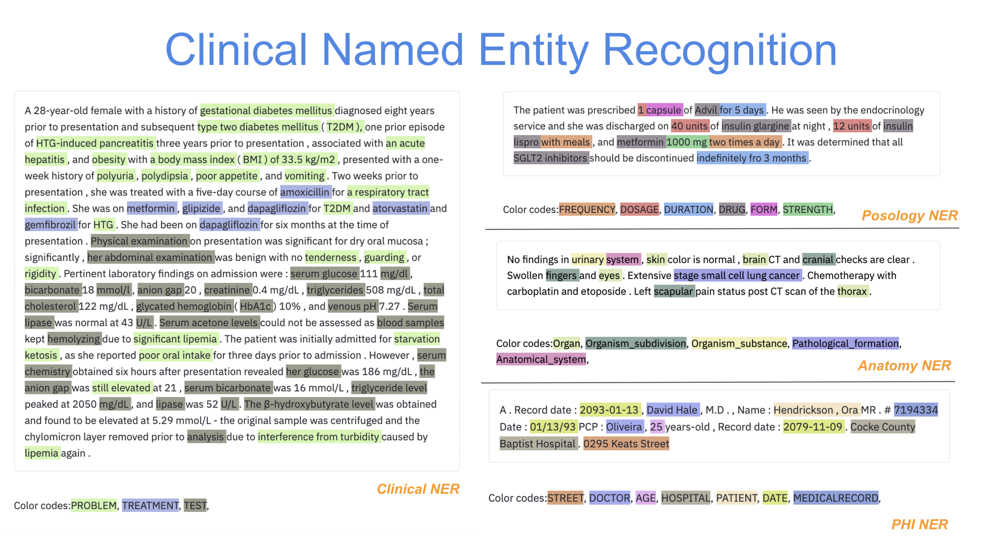

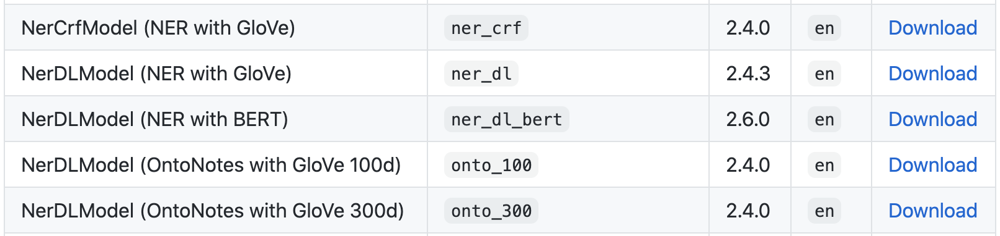

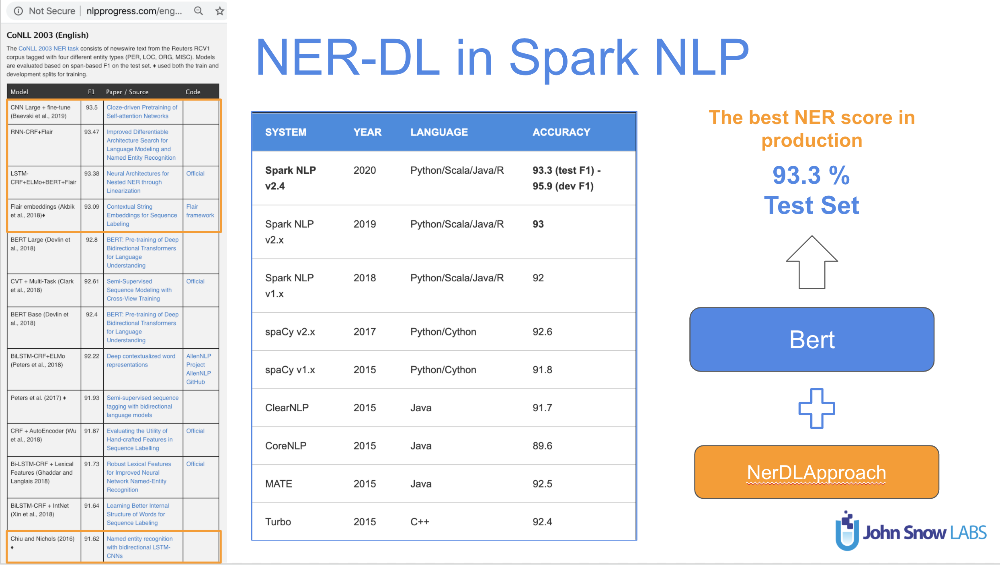

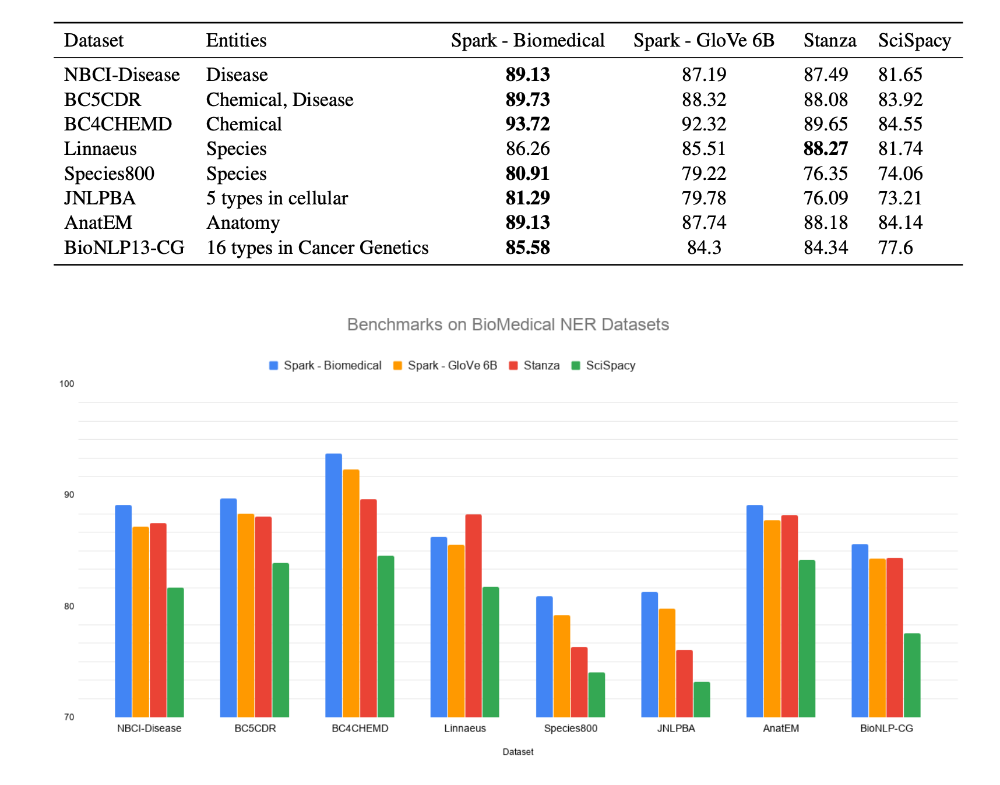

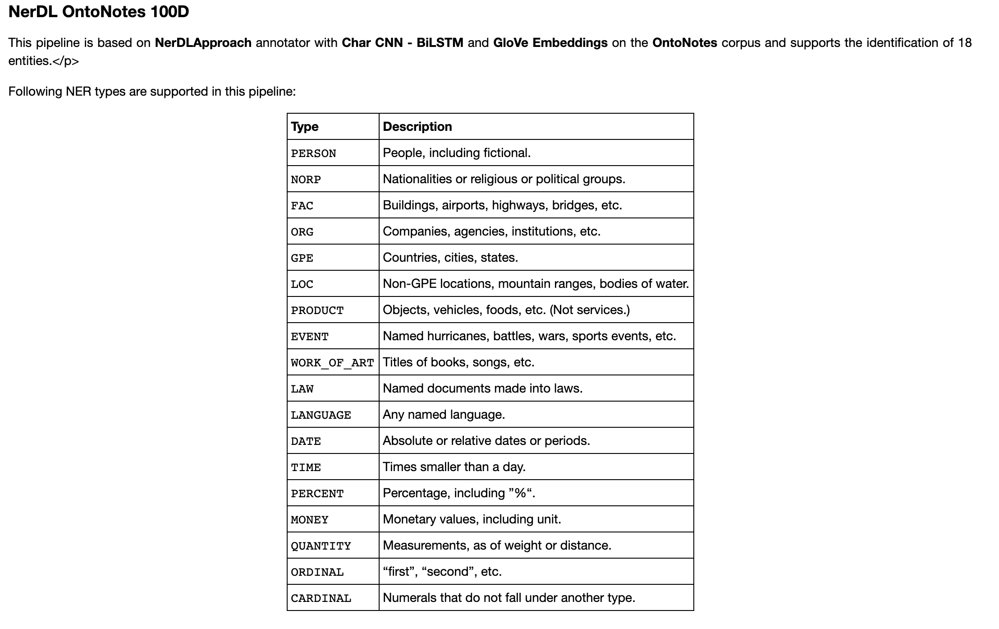

for a detailed notebook, see https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/4.NERDL_Training.ipynb

In [ ]:
documentAssembler = DocumentAssembler()\
      .setInputCol("description")\
      .setOutputCol("document")

tokenizer = Tokenizer() \
      .setInputCols(["document"]) \
      .setOutputCol("token")

glove_embeddings = WordEmbeddingsModel.pretrained('glove_100d')\
          .setInputCols(["document", "token"])\
          .setOutputCol("embeddings")

onto_ner = NerDLModel.pretrained("onto_100", 'en') \
          .setInputCols(["document", "token", "embeddings"]) \
          .setOutputCol("ner")

ner_converter = NerConverter() \
          .setInputCols(["document", "token", "ner"]) \
          .setOutputCol("ner_chunk")


nlpPipeline = Pipeline(stages=[
          documentAssembler, 
          tokenizer,
          glove_embeddings,
          onto_ner,
          ner_converter
])

empty_df = spark.createDataFrame([['']]).toDF("description")

pipelineModel = nlpPipeline.fit(empty_df)

glove_100d download started this may take some time.
Approximate size to download 145.3 MB
[OK!]
onto_100 download started this may take some time.
Approximate size to download 13.5 MB
[OK!]


In [ ]:
result = pipelineModel.transform(news_df.limit(10))

result.select(F.explode(F.arrays_zip('ner_chunk.result', 'ner_chunk.metadata')).alias("cols")) \
.select(F.expr("cols['0']").alias("chunk"),
        F.expr("cols['1']['entity']").alias("ner_label")).show(truncate=False)

+--------------------------------+---------+
|chunk                           |ner_label|
+--------------------------------+---------+
|Carlyle Group                   |ORG      |
|next week                       |DATE     |
|summer                          |DATE     |
|Iraq                            |GPE      |
|Saturday                        |DATE     |
|three months                    |DATE     |
|US                              |GPE      |
|Friday                          |DATE     |
|the year                        |DATE     |
|#36;46                          |CARDINAL |
|Dell Inc                        |ORG      |
|#36;1.17 billion                |CARDINAL |
|the latest week                 |DATE     |
|#36;849.98 trillion             |CARDINAL |
|the Investment Company Institute|ORG      |
|Thursday                        |DATE     |
|July                            |DATE     |
|last week                       |DATE     |
|Thursday                        |DATE     |
|midsummer

In [ ]:
light_model = LightPipeline(pipelineModel)

light_result = light_model.fullAnnotate('Peter Parker is a nice persn and lives in New York. Bruce Wayne is also a nice guy and lives in Gotham City.')


chunks = []
entities = []

for n in light_result[0]['ner_chunk']:
        
    chunks.append(n.result)
    entities.append(n.metadata['entity']) 
    
    
import pandas as pd

df = pd.DataFrame({'chunks':chunks, 'entities':entities})

df

,chunks,entities
0,Peter Parker,PERSON
1,New York,GPE
2,Bruce Wayne,PERSON
3,Gotham City,GPE


#### **Train a NER model**

**To train a new NER from scratch, check out**

https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/4.NERDL_Training.ipynb

In [ ]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp/master/src/test/resources/conll2003/eng.train

In [ ]:
from sparknlp.training import CoNLL

training_data = CoNLL().readDataset(spark, './eng.train')

training_data.show(3)

+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|                text|            document|            sentence|               token|                 pos|               label|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
|EU rejects German...|[[document, 0, 47...|[[document, 0, 47...|[[token, 0, 1, EU...|[[pos, 0, 1, NNP,...|[[named_entity, 0...|
|     Peter Blackburn|[[document, 0, 14...|[[document, 0, 14...|[[token, 0, 4, Pe...|[[pos, 0, 4, NNP,...|[[named_entity, 0...|
| BRUSSELS 1996-08-22|[[document, 0, 18...|[[document, 0, 18...|[[token, 0, 7, BR...|[[pos, 0, 7, NNP,...|[[named_entity, 0...|
+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+
only showing top 3 rows



In [ ]:
training_data.select(F.explode(F.arrays_zip('token.result','label.result')).alias("cols")) \
.select(F.expr("cols['0']").alias("token"),
        F.expr("cols['1']").alias("ground_truth")).groupBy('ground_truth').count().orderBy('count', ascending=False).show(100,truncate=False)

+------------+------+
|ground_truth|count |
+------------+------+
|O           |169578|
|B-LOC       |7140  |
|B-PER       |6600  |
|B-ORG       |6321  |
|I-PER       |4528  |
|I-ORG       |3704  |
|B-MISC      |3438  |
|I-LOC       |1157  |
|I-MISC      |1155  |
+------------+------+



In [ ]:
# You can use any word embeddings you want (Glove, Elmo, Bert, custom etc.)

glove_embeddings = WordEmbeddingsModel.pretrained('glove_100d')\
          .setInputCols(["document", "token"])\
          .setOutputCol("embeddings")

glove_100d download started this may take some time.
Approximate size to download 145.3 MB
[OK!]


In [ ]:
nerTagger = NerDLApproach()\
  .setInputCols(["sentence", "token", "embeddings"])\
  .setLabelColumn("label")\
  .setOutputCol("ner")\
  .setMaxEpochs(1)\
  .setLr(0.003)\
  .setPo(0.005)\
  .setBatchSize(32)\
  .setRandomSeed(0)\
  .setVerbose(1)\
  .setValidationSplit(0.2)\
  .setEvaluationLogExtended(True) \
  .setEnableOutputLogs(True)\
  .setIncludeConfidence(True)\
  .setOutputLogsPath('ner_logs') # if not set, logs will be written to ~/annotator_logs
 #.setGraphFolder('graphs') >> put your graph file (pb) under this folder if you are using a custom graph generated thru 4.1 NerDL-Graph.ipynb notebook
    
    
ner_pipeline = Pipeline(stages=[
          glove_embeddings,
          nerTagger
 ])

In [ ]:
%%time

ner_model = ner_pipeline.fit(training_data)

# 1 epoch takes around 2.5 min with batch size=32
# if you get an error for incompatible TF graph, use 4.1 NerDL-Graph.ipynb notebook to create a graph (or see the bottom cell of this notebook)

CPU times: user 49.7 ms, sys: 5.21 ms, total: 54.9 ms
Wall time: 2min 40s


In [ ]:
#! cd ~/annotator_logs && ls -lt
!cd ner_logs && ls -lt

total 4
-rw-r--r-- 1 root root 1005 Mar 19 07:24 NerDLApproach_5b55ccec6860.log


In [ ]:
!head -n 45 ner_logs/NerDLApproach_5b55ccec6860.log


Name of the selected graph: ner-dl/blstm_10_100_128_120.pb
Training started - total epochs: 1 - lr: 0.003 - batch size: 32 - labels: 9 - chars: 84 - training examples: 11205


Epoch 1/1 started, lr: 0.003, dataset size: 11205


Epoch 1/1 - 116.08s - loss: 1051.715 - batches: 353
Quality on validation dataset (20.0%), validation examples = 2241
time to finish evaluation: 9.05s
label	 tp	 fp	 fn	 prec	 rec	 f1
B-LOC	 1317	 95	 129	 0.9327195	 0.91078836	 0.92162347
I-ORG	 660	 122	 172	 0.8439898	 0.7932692	 0.8178439
I-MISC	 170	 37	 87	 0.82125604	 0.6614786	 0.7327586
I-LOC	 173	 42	 76	 0.80465114	 0.6947791	 0.7456897
I-PER	 880	 39	 28	 0.95756257	 0.969163	 0.9633278
B-MISC	 585	 127	 91	 0.8216292	 0.86538464	 0.8429395
B-ORG	 1130	 178	 197	 0.8639144	 0.85154486	 0.857685
B-PER	 1225	 94	 65	 0.9287339	 0.9496124	 0.9390571
tp: 6140 fp: 734 fn: 845 labels: 8
Macro-average	 prec: 0.87180704, rec: 0.8370025, f1: 0.8540503
Micro-average	 prec: 0.89322084, rec: 0.8790265, f1: 0.886

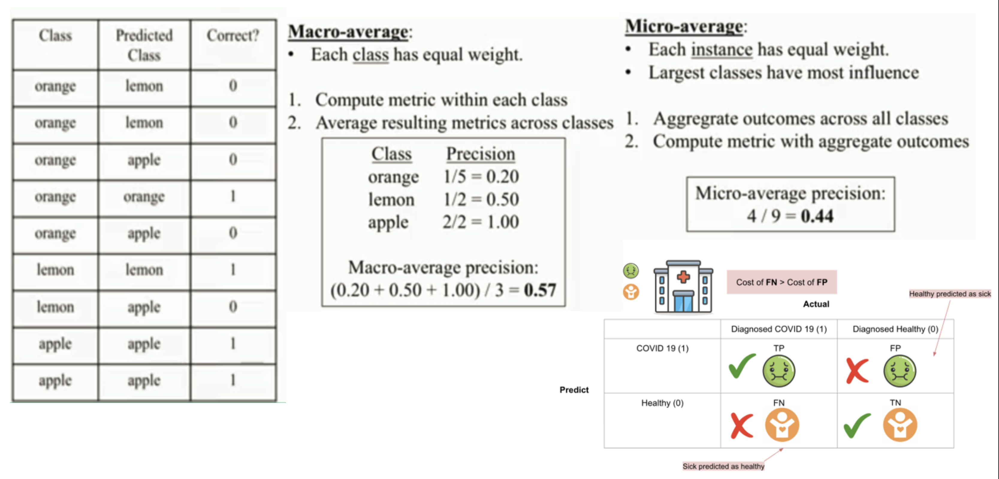

In [ ]:
ner_model.stages[1].write().overwrite().save('NER_glove_20210319_e1_b32')


In [ ]:
# load back and use in any pipeline

loaded_ner_model = NerDLModel.load("NER_glove_20210319_e1_b32")\
    .setInputCols(["sentence", "token", "embeddings"])\
    .setOutputCol("ner")


### Text Classification

for a detailed notebook, see https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Public/5.Text_Classification_with_ClassifierDL.ipynb

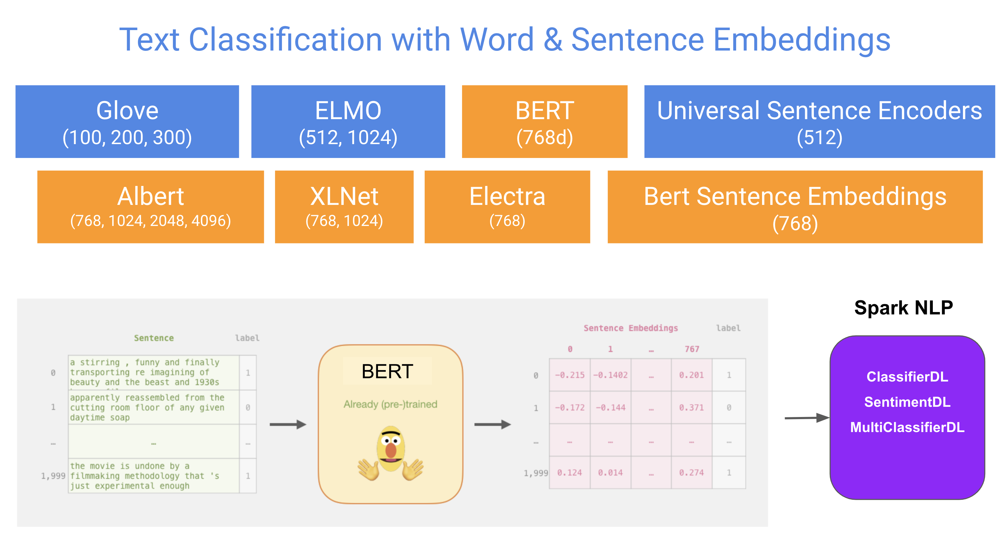

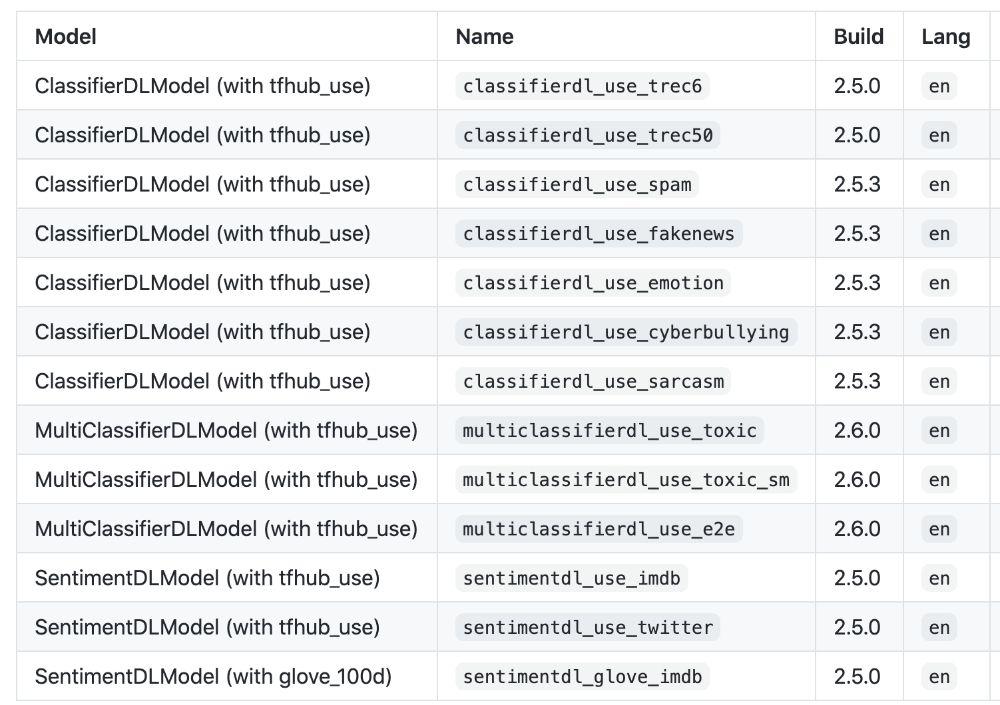

In [ ]:
! wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-nlp-workshop/master/tutorials/Certification_Trainings/Public/data/news_category_test.csv

In [ ]:
from pyspark.sql.functions import col

trainDataset = spark.read \
      .option("header", True) \
      .csv("news_category_train.csv")

trainDataset.groupBy("category") \
      .count() \
      .orderBy(col("count").desc()) \
      .show()

+--------+-----+
|category|count|
+--------+-----+
|   World|30000|
|  Sports|30000|
|Sci/Tech|30000|
|Business|30000|
+--------+-----+



In [ ]:
testDataset = spark.read \
    .option("header", True) \
    .csv("news_category_test.csv")


testDataset.groupBy("category") \
    .count() \
    .orderBy(col("count").desc()) \
    .show()

+--------+-----+
|category|count|
+--------+-----+
|   World| 1900|
|Sci/Tech| 1900|
|Business| 1900|
|  Sports| 1900|
+--------+-----+



In [ ]:
# actual content is inside description column
document = DocumentAssembler()\
    .setInputCol("description")\
    .setOutputCol("document")
    
# we can also use sentece detector here if we want to train on and get predictions for each sentence

use_embeddings = UniversalSentenceEncoder.pretrained('tfhub_use')\
    .setInputCols(["document"])\
    .setOutputCol("sentence_embeddings")

# the classes/labels/categories are in category column
classsifierdl = ClassifierDLApproach()\
    .setInputCols(["sentence_embeddings"])\
    .setOutputCol("class")\
    .setLabelColumn("category")\
    .setMaxEpochs(5)\
    .setEnableOutputLogs(True)

use_clf_pipeline = Pipeline(
    stages = [
        document,
        use_embeddings,
        classsifierdl
    ])

tfhub_use download started this may take some time.
Approximate size to download 923.7 MB
[OK!]


In [ ]:
use_pipelineModel = use_clf_pipeline.fit(trainDataset)
# 5 epochs takes around 10 min

In [ ]:
!cd ~/annotator_logs && ls -lt

total 4
-rw-r--r-- 1 root root 462 Mar 19 07:48 ClassifierDLApproach_742f8769e422.log


In [ ]:
!cat ~/annotator_logs/ClassifierDLApproach_742f8769e422.log

Training started - epochs: 5 - learning_rate: 0.005 - batch_size: 64 - training_examples: 120000 - classes: 4
Epoch 0/5 - 29.94s - loss: 1607.8239 - acc: 0.88035834 - batches: 1875
Epoch 1/5 - 28.89s - loss: 1580.8262 - acc: 0.89259166 - batches: 1875
Epoch 2/5 - 28.09s - loss: 1576.5359 - acc: 0.89738333 - batches: 1875
Epoch 3/5 - 28.37s - loss: 1567.3359 - acc: 0.90136665 - batches: 1875
Epoch 4/5 - 30.09s - loss: 1560.6365 - acc: 0.90425 - batches: 1875


In [ ]:
from sparknlp.base import LightPipeline

light_model = LightPipeline(use_pipelineModel)

text='''
Fearing the fate of Italy, the centre-right government has threatened to be merciless with those who flout tough restrictions. 
As of Wednesday it will also include all shops being closed across Greece, with the exception of supermarkets. Banks, pharmacies, pet-stores, mobile phone stores, opticians, bakers, mini-markets, couriers and food delivery outlets are among the few that will also be allowed to remain open.
'''
result = light_model.annotate(text)

result['class']

['Business']

In [ ]:
light_model.annotate('the soccer games will be postponed.')


{'class': ['Sports'],
 'document': ['the soccer games will be postponed.'],
 'sentence_embeddings': ['the soccer games will be postponed.']}

## **Visualizaton**

To learn more about spark nlp display library check
https://github.com/JohnSnowLabs/spark-nlp-display 

### **Dependency Parser Visualisation**

In [ ]:
documentAssembler = DocumentAssembler()\
        .setInputCol("text")\
        .setOutputCol("document")

tokenizer = Tokenizer() \
        .setInputCols(["document"]) \
        .setOutputCol("token")

pos = PerceptronModel.pretrained("pos_anc", 'en')\
        .setInputCols("document", "token")\
        .setOutputCol("pos")

chunker = Chunker()\
        .setInputCols(["document", "pos"])\
        .setOutputCol("chunk")\
        .setRegexParsers(["<NNP>+", "<DT>?<JJ>*<NN>"])


dep_parser = DependencyParserModel.pretrained('dependency_conllu')\
        .setInputCols(["document", "pos", "token"])\
        .setOutputCol("dependency")


typed_dep_parser = TypedDependencyParserModel.pretrained('dependency_typed_conllu')\
        .setInputCols(["token", "pos", "dependency"])\
        .setOutputCol("dependency_type")


nlpPipeline = Pipeline(
      stages = [
        documentAssembler,
        tokenizer,
        pos,
        dep_parser,
        typed_dep_parser
      ])

empty_df = spark.createDataFrame([['']]).toDF("text")

pipelineModel = nlpPipeline.fit(empty_df)
lmodel = LightPipeline(pipelineModel)

pos_anc download started this may take some time.
Approximate size to download 4.3 MB
[OK!]
dependency_conllu download started this may take some time.
Approximate size to download 16.6 MB
[OK!]
dependency_typed_conllu download started this may take some time.
Approximate size to download 257.4 KB
[OK!]


In [ ]:
text = ['John Snow is a good man.']
res = lmodel.fullAnnotate(text)[0]

In [ ]:
from sparknlp_display import DependencyParserVisualizer

dependency_vis = DependencyParserVisualizer()
dependency_vis.display(res, 'pos', 'dependency', 'dependency_type')

### **NER Output Visualization**

In [ ]:
example = ["The Mona Lisa is a 16th century oil painting created by Leonardo. It's held at the Louvre in Paris."]

####**Pre-trained pipeline**

In [ ]:
pipeline = PretrainedPipeline('recognize_entities_dl', lang='en')

recognize_entities_dl download started this may take some time.
Approx size to download 159 MB
[OK!]


In [ ]:
ppres = pipeline.fullAnnotate(example)[0]
ppres.keys()

dict_keys(['entities', 'document', 'token', 'ner', 'embeddings', 'sentence'])

In [ ]:
from sparknlp_display import NerVisualizer

visualiser = NerVisualizer()
print ('Standard Output')
visualiser.display(ppres, label_col='entities', document_col='document')

# Change color of an entity label
visualiser.set_label_colors({'LOC':'#008080', 'PER':'#800080'})
visualiser.display(ppres, label_col='entities')

# Set label filter
visualiser.display(ppres, label_col='entities', document_col='document',
                   labels=['PER'])

print ('color code for label "LOC": ' + visualiser.get_label_color('LOC'))

Standard Output


color code for label "LOC": #008080


####**New Pipeline**

In [ ]:

documentAssembler = DocumentAssembler()\
    .setInputCol("text")\
    .setOutputCol("document")

tokenizer = Tokenizer() \
    .setInputCols(["document"]) \
    .setOutputCol("token")

embeddings = WordEmbeddingsModel.pretrained('glove_100d').\
                  setInputCols(["document", 'token']).\
                  setOutputCol("embeddings")

public_ner = NerDLModel.pretrained('ner_dl', 'en') \
          .setInputCols(["document", "token", "embeddings"]) \
          .setOutputCol("ner")

ner_converter = NerConverter() \
                .setInputCols(["document", "token", "ner"]) \
                  .setOutputCol("entities")

nlpPipeline = Pipeline(stages=[ documentAssembler, 
                                 tokenizer,
                                 embeddings,
                                 public_ner,
                                 ner_converter
                                 ])

empty_df = spark.createDataFrame([['']]).toDF("text")

pipelineModel = nlpPipeline.fit(empty_df)
lmodel = LightPipeline(pipelineModel)

glove_100d download started this may take some time.
Approximate size to download 145.3 MB
[OK!]
ner_dl download started this may take some time.
Approximate size to download 13.6 MB
[OK!]


#####**Display Using Light Pipeline Results**

In [ ]:
cpres = lmodel.fullAnnotate(example)[0]
cpres.keys()

dict_keys(['entities', 'document', 'token', 'ner', 'embeddings'])

In [ ]:
from sparknlp_display import NerVisualizer
visualiser = NerVisualizer()
print ('Standard Output')
visualiser.display(ppres, label_col='entities', document_col='document')

# Change color of an entity label
visualiser.set_label_colors({'LOC':'#008080', 'PER':'#800080'})
visualiser.display(ppres, label_col='entities')

# Set label filter
visualiser.display(ppres, label_col='entities', document_col='document',
                   labels=['PER'])

Standard Output
